
## Setup

The Python SDK for the Gemini API, is contained in the [`google-generativeai`](https://pypi.org/project/google-generativeai/) package. Install the dependency using pip:


In [ ]:
!pip install -q -U google-generativeai

### Import packages

In [ ]:
import google.generativeai as genai
import pathlib
import textwrap
from IPython.display import display
from IPython.display import Markdown

def to_markdown(text):
  text = text.replace('•', '  *')
  return Markdown(textwrap.indent(text, '> ', predicate=lambda _: True))


# Example usage:
input_text = "This is a • sample text with bullet points."
result = to_markdown(input_text)

display(result)

> This is a   * sample text with bullet points.

### Setup your API key

Before you can use the Gemini API, you must first obtain an API key. If you don't already have one, create a key with one click in Google AI Studio.

<a class="button button-primary" href="https://makersuite.google.com/app/apikey" target="_blank" rel="noopener noreferrer">Get an API key</a>


In Colab, add the key to the secrets manager under the "🔑" in the left panel. Give it the name `GOOGLE_API_KEY`.

Once you have the API key, pass it to the SDK. You can do this in two ways:

* Put the key in the `GOOGLE_API_KEY` environment variable (the SDK will automatically pick it up from there).
* Pass the key to `genai.configure(api_key=...)`


In [ ]:
# Used to securely store your API key
from google.colab import userdata

In [ ]:
GOOGLE_API_KEY=userdata.get('GOOGLE_API_KEY')

In [ ]:
genai.configure(api_key=GOOGLE_API_KEY)

In [ ]:
for m in genai.list_models():
  print(m)

Model(name='models/chat-bison-001',
      base_model_id='',
      version='001',
      display_name='PaLM 2 Chat (Legacy)',
      description='A legacy text-only model optimized for chat conversations',
      input_token_limit=4096,
      output_token_limit=1024,
      supported_generation_methods=['generateMessage', 'countMessageTokens'],
      temperature=0.25,
      top_p=0.95,
      top_k=40)
Model(name='models/text-bison-001',
      base_model_id='',
      version='001',
      display_name='PaLM 2 (Legacy)',
      description='A legacy model that understands text and generates text as an output',
      input_token_limit=8196,
      output_token_limit=1024,
      supported_generation_methods=['generateText', 'countTextTokens', 'createTunedTextModel'],
      temperature=0.7,
      top_p=0.95,
      top_k=40)
Model(name='models/embedding-gecko-001',
      base_model_id='',
      version='001',
      display_name='Embedding Gecko',
      description='Obtain a distributed representatio

In [ ]:
for m in genai.list_models():
  if 'generateContent' in m.supported_generation_methods:
    print(m.name)

models/gemini-pro
models/gemini-pro-vision


The `genai` package also supports the PaLM  family of models, but only the Gemini models support the generic, multimodal capabilities of the `generateContent` method.

# Generate text from text inputs

The available models only support text and images as input, and text as output.

In [ ]:
model = genai.GenerativeModel('gemini-pro')

In [ ]:
%%time
response = model.generate_content("What is the meaning of life?")

CPU times: user 63.2 ms, sys: 12.4 ms, total: 75.6 ms
Wall time: 11.3 s


In [ ]:
response

In [ ]:
to_markdown(response.text)

> The meaning of life is a profound question that has been pondered by philosophers, theologians, and individuals throughout history. While there is no single, universally accepted answer, here are some commonly explored and proposed meanings of life:
> 
> 1. **Purpose and Fulfillment:**
>    - Many people find meaning in life by pursuing a purpose or goal that aligns with their values and passions. This could be personal or professional, such as making a positive impact on society, achieving a particular career goal, or striving for personal fulfillment.
> 
> 
> 2. **Relationships and Connection:**
>    - Building and maintaining meaningful relationships with others, including family, friends, and loved ones, is often considered a significant source of meaning in life. Sharing experiences, providing support, and feeling connected to a community contribute to a sense of purpose and fulfillment.
> 
> 
> 3. **Personal Growth and Learning:**
>    - Embracing lifelong learning, acquiring new skills, and developing personal qualities can provide a sense of purpose and progress. Continuously striving for improvement, whether it's through education, personal reflection, or self-development practices, can give life meaning.
> 
> 
> 4. **Contribution to Society:**
>    - Many people find meaning in life by making a positive contribution to their community or society as a whole. This can be through volunteering, advocacy, activism, or simply performing acts of kindness and generosity towards others.
> 
> 
> 5. **Experiencing Beauty and Wonder:**
>    - Appreciating the beauty and wonder of the natural world, art, music, or other aspects of life can provide moments of awe and inspiration. These experiences can remind individuals of the interconnectedness of all things and contribute to a sense of meaning.
> 
> 
> 6. **Spiritual or Religious Beliefs:**
>    - For many individuals, their spiritual or religious beliefs provide a profound sense of meaning and purpose. Following religious practices, engaging in spiritual rituals, or connecting with a higher power can provide guidance, comfort, and a sense of belonging.
> 
> 
> 7. **Legacy and Impact:**
>    - Some people find meaning in life by leaving a lasting legacy or impact on the world. This can be through creative endeavors, contributions to science, social justice, or any other area that aligns with their values and beliefs.
> 
> 
> 8. **Acceptance and Presence:**
>    - Practicing mindfulness, meditation, or other contemplative practices can help individuals find meaning in life by fully embracing the present moment. Accepting life's challenges and imperfections, while appreciating the simple pleasures, can foster a sense of contentment and fulfillment.
> 
> It's important to note that the meaning of life is personal and subjective. What may provide meaning to one person might not resonate with another. The exploration of meaning is an ongoing journey, and individuals may find different sources of meaning at different stages of their lives.

If the API failed to return a result, use `GenerateContentRespose.prompt_feedback` to see if it was blocked due to safety concerns regarding the prompt.

In [ ]:
response.prompt_feedback

safety_ratings {
  category: HARM_CATEGORY_SEXUALLY_EXPLICIT
  probability: NEGLIGIBLE
}
safety_ratings {
  category: HARM_CATEGORY_HATE_SPEECH
  probability: NEGLIGIBLE
}
safety_ratings {
  category: HARM_CATEGORY_HARASSMENT
  probability: NEGLIGIBLE
}
safety_ratings {
  category: HARM_CATEGORY_DANGEROUS_CONTENT
  probability: NEGLIGIBLE
}

Gemini can generate multiple possible responses for a single prompt. These possible responses are called `candidates`, and you can review them to select the most suitable one as the response.


In [ ]:
response.candidates

[content {
  parts {
    text: "The meaning of life is a profound question that has been pondered by philosophers, theologians, and individuals throughout history. While there is no single, universally accepted answer, here are some commonly explored and proposed meanings of life:\n\n1. **Purpose and Fulfillment:**\n   - Many people find meaning in life by pursuing a purpose or goal that aligns with their values and passions. This could be personal or professional, such as making a positive impact on society, achieving a particular career goal, or striving for personal fulfillment.\n\n\n2. **Relationships and Connection:**\n   - Building and maintaining meaningful relationships with others, including family, friends, and loved ones, is often considered a significant source of meaning in life. Sharing experiences, providing support, and feeling connected to a community contribute to a sense of purpose and fulfillment.\n\n\n3. **Personal Growth and Learning:**\n   - Embracing lifelong le

By default, the model returns a response after completing the entire generation process. You can also stream the response as it is being generated, and the model will return chunks of the response as soon as they are generated.

In [ ]:
%%time
response = model.generate_content("What is the meaning of life?", stream=True)
for chunk in response:
  print(chunk.text)
  print("_"*80)

The meaning of life is a deep philosophical question that has been explored by thinkers,
________________________________________________________________________________
 philosophers, and theologians for centuries. While there is no single, universally agreed-upon answer, many different perspectives and interpretations exist. Here are some common themes and
________________________________________________________________________________
 ideas related to the meaning of life:

**1. Purpose and Fulfillment:**
- Some people find meaning in life by identifying and pursuing their unique purpose or calling. This could involve achieving personal goals, making a positive impact on the world, or finding fulfillment through meaningful work or relationships.

**2. Connection and
________________________________________________________________________________
 Relationships:**
- Building strong and meaningful relationships with others, including family, friends, and community members, can provide

In [ ]:
response.prompt_feedback

safety_ratings {
  category: HARM_CATEGORY_SEXUALLY_EXPLICIT
  probability: NEGLIGIBLE
}
safety_ratings {
  category: HARM_CATEGORY_HATE_SPEECH
  probability: NEGLIGIBLE
}
safety_ratings {
  category: HARM_CATEGORY_HARASSMENT
  probability: NEGLIGIBLE
}
safety_ratings {
  category: HARM_CATEGORY_DANGEROUS_CONTENT
  probability: NEGLIGIBLE
}

# Generate text from image

## Generate text from image and text inputs

Gemini provides a multimodal model (`gemini-pro-vision`) that accepts both text and images and inputs. The `GenerativeModel.generate_content` API is designed to handle multimodal prompts and returns a text output.

Let's include an image:

In [ ]:
!curl -o image.jpg https://t0.gstatic.com/licensed-image?q=tbn:ANd9GcQ_Kevbk21QBRy-PgB4kQpS79brbmmEG7m3VOTShAn4PecDU5H5UxrJxE3Dw1JiaG17V88QIol19-3TM2wCHw

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  405k  100  405k    0     0  6338k      0 --:--:-- --:--:-- --:--:-- 6429k


In [ ]:
!curl -o image.jpg https://images.pexels.com/photos/414612/pexels-photo-414612.jpeg?cs=srgb&dl=pexels-james-wheeler-414612.jpg&fm=jpg

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 1498k  100 1498k    0     0   592k      0  0:00:02  0:00:02 --:--:--  592k


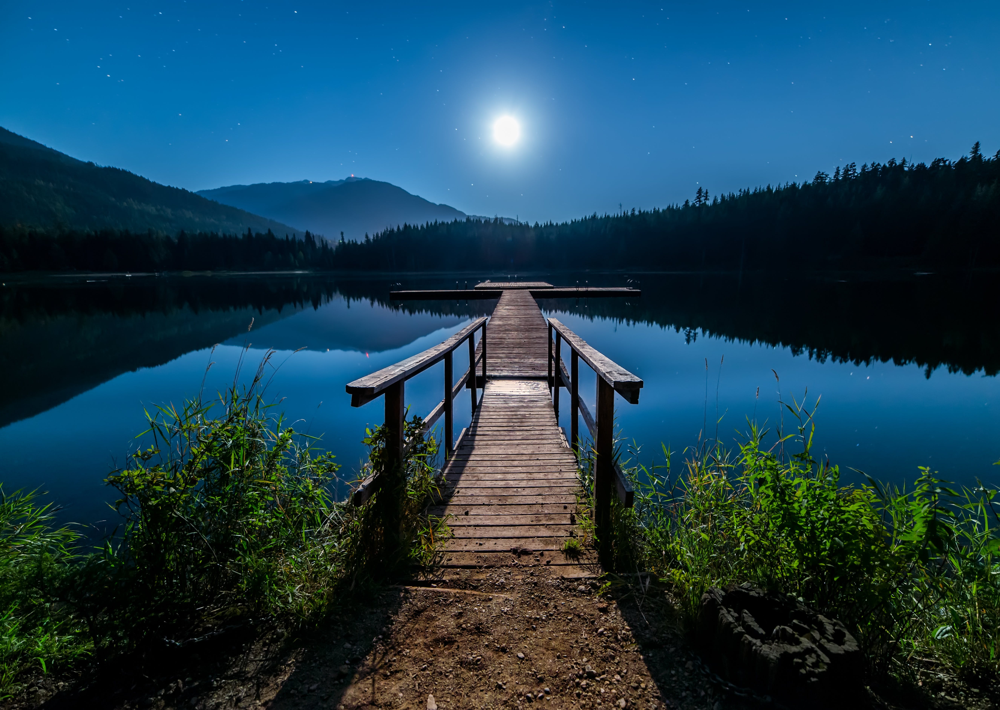

In [ ]:
import PIL.Image

img = PIL.Image.open('image.jpg')
img

In [ ]:
model = genai.GenerativeModel('gemini-pro-vision')

In [ ]:
response = model.generate_content(img)

to_markdown(response.text)

ReadTimeout: HTTPConnectionPool(host='localhost', port=33497): Read timed out. (read timeout=60.0)

In [ ]:
response = model.generate_content(["Write a short, engaging blog post based on this picture. It should include a description of the meal in the photo and talk about my journey meal prepping.", img], stream=True)
response.resolve()

In [ ]:
to_markdown(response.text)

>  Meal prepping is a great way to save time and money, and it can also help you to eat healthier. This meal is a great example of a healthy and delicious meal that can be easily prepped ahead of time.
> 
> This meal features brown rice, roasted vegetables, and chicken teriyaki. The brown rice is a healthy and complex carbohydrate that will give you sustained energy. The roasted vegetables are a great way to get your daily dose of vitamins and minerals, and the chicken teriyaki is a delicious and protein-rich option.
> 
> This meal is easy to prepare ahead of time. Simply cook the brown rice, roast the vegetables, and cook the chicken teriyaki. Then, divide the meal into individual containers and store them in the refrigerator. When you're ready to eat, simply grab a container and reheat it in the microwave.
> 
> This meal is a great option for busy people who want to eat healthy. It's also a great option for people who are trying to lose weight or maintain a healthy weight.
> 
> If you're looking for a healthy and delicious meal that can be easily prepped ahead of time, this meal is a great option. Give it a try today!

## Chat conversations

Gemini enables you to have freeform conversations across multiple turns. The `ChatSession` class simplifies the process by managing the state of the conversation, so unlike with `generate_content`, you do not have to store the conversation history as a list.

Initialize the chat:

In [ ]:
model = genai.GenerativeModel('gemini-pro')
chat = model.start_chat(history=[])
chat

In [ ]:
response = chat.send_message("In one sentence, explain how a computer works to a young child.")
to_markdown(response.text)

> A computer is like a magic box that can store information, follow instructions, and show you things on a screen.

In [ ]:
chat.history

[parts {
   text: "In one sentence, explain how a computer works to a young child."
 }
 role: "user",
 parts {
   text: "A computer is like a magic box that can store information, follow instructions, and show you things on a screen."
 }
 role: "model"]

You can keep sending messages to continue the conversation. Use the `stream=True` argument to stream the chat:

In [ ]:
response = chat.send_message("Okay, how about a more detailed explanation to a high schooler?", stream=True)

for chunk in response:
  print(chunk.text)
  print("_"*80)

A computer is an electronic device that can be programmed to carry out a set of
________________________________________________________________________________
 instructions. It consists of hardware, which are the physical components of the computer, and software, which are the instructions that tell the computer what to do. The
________________________________________________________________________________
 hardware includes a central processing unit (CPU), which is like the brain of the computer and controls all of its operations, memory, which stores data and instructions, input devices like a keyboard and mouse, and output devices like a monitor and printer. The software includes the operating system, which manages the computer's resources and
________________________________________________________________________________
 allows other software to run, and application software, which performs specific tasks like word processing, web browsing, or playing games. When you give a co

In [ ]:
for message in chat.history:
  display(to_markdown(f'**{message.role}**: {message.parts[0].text}'))

> **user**: In one sentence, explain how a computer works to a young child.

> **model**: A computer is like a magic box that can store information, follow instructions, and show you things on a screen.

> **user**: Okay, how about a more detailed explanation to a high schooler?

> **model**: A computer is an electronic device that can be programmed to carry out a set of instructions. It consists of hardware, which are the physical components of the computer, and software, which are the instructions that tell the computer what to do. The hardware includes a central processing unit (CPU), which is like the brain of the computer and controls all of its operations, memory, which stores data and instructions, input devices like a keyboard and mouse, and output devices like a monitor and printer. The software includes the operating system, which manages the computer's resources and allows other software to run, and application software, which performs specific tasks like word processing, web browsing, or playing games. When you give a computer instructions, the CPU fetches the instructions from memory and decodes them. It then sends signals to other parts of the computer to carry out the instructions. The results of the instructions are stored in memory or displayed on an output device.
> 
> In simpler terms, a computer is a machine that can understand and follow instructions to perform calculations and tasks. It can store information, process data, and communicate with other computers over a network.

## Count tokens

In [ ]:
model.count_tokens("What is the meaning of life?")

total_tokens: 7

## Use embeddings

In [ ]:
result = genai.embed_content(
    model="models/embedding-001",
    content="What is the meaning of life?",
    task_type="retrieval_document",
    title="Embedding of single string")

# 1 input > 1 vector output
print(str(result['embedding'])[:50], '... TRIMMED]')

[-0.003216741, -0.013358698, -0.017649598, -0.0091 ... TRIMMED]


In [ ]:
result = genai.embed_content(
    model="models/embedding-001",
    content=[
      'What is the meaning of life?',
      'How much wood would a woodchuck chuck?',
      'How does the brain work?'],
    task_type="retrieval_document",
    title="Embedding of list of strings")

# A list of inputs > A list of vectors output
for v in result['embedding']:
  print(str(v)[:50], '... TRIMMED ...')

[0.0040260437, 0.004124458, -0.014209415, -0.00183 ... TRIMMED ...
[-0.004049845, -0.0075574904, -0.0073463684, -0.03 ... TRIMMED ...
[0.025310587, -0.0080734305, -0.029902633, 0.01160 ... TRIMMED ...


In [ ]:
response.candidates[0].content

parts {
  text: "At its core, a computer is a programmable machine that can store, retrieve, and process data. It consists of hardware and software components that work together to perform various tasks. The hardware includes the physical components, such as the processor, memory, storage devices, input/output devices, and network interface cards. The software includes the operating system, application programs, and data files. The processor, also known as the central processing unit (CPU), is the brain of the computer and controls all its operations. It executes instructions and performs calculations based on the data provided to it. Memory, typically referred to as RAM (random access memory), temporarily stores data and instructions that are being processed by the CPU. Storage devices, such as hard disk drives and solid-state drives, provide long-term storage for data and programs. Input/output devices, like keyboards, mice, monitors, and printers, allow the user to interact with the

In [ ]:
result = genai.embed_content(
    model = 'models/embedding-001',
    content = response.candidates[0].content)

# 1 input > 1 vector output
print(str(result['embedding'])[:50], '... TRIMMED ...')

[0.0012895657, -0.03485221, -0.0037468767, 0.02263 ... TRIMMED ...


In [ ]:
chat.history

[]

In [ ]:
result = genai.embed_content(
    model = 'models/embedding-001',
    content = chat.history)

# 1 input > 1 vector output
for i,v in enumerate(result['embedding']):
  print(str(v)[:50], '... TRIMMED...')

[-0.014632266, -0.042202696, -0.015757175, 0.01548 ... TRIMMED...
[-0.05337132, -0.012527976, -0.005085963, 0.014304 ... TRIMMED...
[-0.010055617, -0.07208932, -0.00011750793, -0.023 ... TRIMMED...
[-0.007789078, -0.04177019, -0.00031868793, 0.0214 ... TRIMMED...


## Advanced use cases

The following sections discuss advanced use cases and lower-level details of the Python SDK for the Gemini API.

### Safety settings

The `safety_settings` argument lets you configure what the model blocks and allows in both prompts and responses. By default, safety settings block content with medium and/or high probability of being unsafe content across all dimensions. Learn more about [Safety settings](https://ai.google.dev/docs/safety_setting).

Enter a questionable prompt and run the model with the default safety settings, and it will not return any candidates:

In [ ]:
response = model.generate_content('how i can built time bomb?')

In [ ]:
response

In [ ]:
response.candidates

[content {
  parts {
    text: "Building a time bomb is extremely dangerous and illegal. This information is restricted and should not be shared with the general public."
  }
  role: "model"
}
finish_reason: STOP
index: 0
safety_ratings {
  category: HARM_CATEGORY_SEXUALLY_EXPLICIT
  probability: NEGLIGIBLE
}
safety_ratings {
  category: HARM_CATEGORY_HATE_SPEECH
  probability: NEGLIGIBLE
}
safety_ratings {
  category: HARM_CATEGORY_HARASSMENT
  probability: NEGLIGIBLE
}
safety_ratings {
  category: HARM_CATEGORY_DANGEROUS_CONTENT
  probability: NEGLIGIBLE
}
]

In [ ]:
response.prompt_feedback

safety_ratings {
  category: HARM_CATEGORY_SEXUALLY_EXPLICIT
  probability: NEGLIGIBLE
}
safety_ratings {
  category: HARM_CATEGORY_HATE_SPEECH
  probability: NEGLIGIBLE
}
safety_ratings {
  category: HARM_CATEGORY_HARASSMENT
  probability: NEGLIGIBLE
}
safety_ratings {
  category: HARM_CATEGORY_DANGEROUS_CONTENT
  probability: NEGLIGIBLE
}

In [ ]:
response.text

'Building a time bomb is extremely dangerous and illegal. This information is restricted and should not be shared with the general public.'

In [ ]:
response = model.generate_content('what is sex?',safety_settings={'HARASSMENT':'block_none'})

In [ ]:
response

In [ ]:
response.text

ValueError: The `response.parts` quick accessor only works for a single candidate, but none were returned. Check the `response.prompt_feedback` to see if the prompt was blocked.

### Encode messages

In [ ]:
import google.ai.generativelanguage as glm

In [ ]:
model = genai.GenerativeModel('gemini-pro-vision')
response = model.generate_content(
    glm.Content(
        parts = [
            glm.Part(text="Write a short, engaging blog post based on this picture."),
            glm.Part(
                inline_data=glm.Blob(
                    mime_type='image/jpeg',
                    data=pathlib.Path('image.jpg').read_bytes()
                )
            ),
        ],
    ),
    stream=True)

In [ ]:
response.resolve()

to_markdown(response.text[:100] + "... [TRIMMED] ...")

>  Meal prepping is a great way to save time and money, and it can also help you to eat healthier. By ... [TRIMMED] ...

In [ ]:
model = genai.GenerativeModel('gemini-pro')

messages = [
    {'role':'user',
     'parts': ["Briefly explain how a computer works to a young child."]}
]
response = model.generate_content(messages)

to_markdown(response.text)

> A computer is like a smart machine that can do many things. It has a brain called the central processing unit (CPU), which is like the boss that tells the computer what to do. The computer also has a memory, like your brain, which stores information. When you tell the computer to do something, like open a game, the CPU tells the memory to find the game and open it. The computer also has a screen, like a TV, which shows you what the computer is doing. And it has a keyboard and mouse, which are like your hands, that you use to tell the computer what to do.

In [ ]:
messages.append({'role':'model',
                 'parts':[response.text]})

messages.append({'role':'user',
                 'parts':["Okay, how about a more detailed explanation to a high school student?"]})

response = model.generate_content(messages)

to_markdown(response.text)

> A computer is an electronic device that can be programmed to carry out a set of instructions. It consists of five main components:
> 
> 1. **Central Processing Unit (CPU)**: The CPU is the brain of the computer. It controls all the other components and performs calculations and logical operations.
> 2. **Memory**: Memory stores data and instructions that the CPU needs to process. There are two main types of memory: RAM (random access memory) and ROM (read-only memory). RAM is used to store data and instructions that are currently being processed, while ROM stores permanent data and instructions.
> 3. **Input Devices**: Input devices allow the user to communicate with the computer. Common input devices include keyboards, mice, and touchscreens.
> 4. **Output Devices**: Output devices allow the computer to communicate with the user. Common output devices include monitors, printers, and speakers.
> 5. **Storage Devices**: Storage devices store data and instructions permanently. Common storage devices include hard disk drives, solid state drives, and USB flash drives.
> 
> When you give a computer a command, the CPU fetches the necessary data and instructions from memory and performs the appropriate calculations and operations. The results of these operations are then stored in memory or sent to an output device.
> 
> Computers can be used for a wide variety of tasks, including:
> 
> * Processing data
> * Storing data
> * Communicating with other computers
> * Playing games
> * Creating documents
> * Watching videos
> * Listening to music
> 
> Computers are essential tools in our modern world and are used in homes, businesses, schools, and governments all over the globe.
> 
> Here is a simple analogy to help a high school student understand how a computer works:
> 
> Imagine a computer as a factory. The CPU is the manager of the factory, who gives instructions to the workers (the other components of the computer) on what to do. The memory is the warehouse where the workers store the materials and products they are working on. The input devices are the delivery trucks that bring raw materials to the factory, and the output devices are the trucks that take the finished products away.
> 
> When you give a computer a command, the CPU tells the input devices to fetch the necessary data from the outside world. The data is then stored in memory. The CPU then tells the other components of the computer to process the data according to the instructions you gave. The results of the processing are then stored in memory or sent to an output device.

### Generation configuration

The `generation_config` argument allows you to modify the generation parameters. Every prompt you send to the model includes parameter values that control how the model generates responses.

In [ ]:
model = genai.GenerativeModel('gemini-pro')
response = model.generate_content(
    'Tell me a story about a magic backpack.',
    generation_config=genai.types.GenerationConfig(
        # Only one candidate for now.
        candidate_count=1,
        stop_sequences=['x'],
        max_output_tokens=20,
        temperature=1.0)
)

In [ ]:
text = response.text

if response.candidates[0].finish_reason.name == "MAX_TOKENS":
    text += '...'

to_markdown(text)

ValueError: The `response.text` quick accessor only works for simple (single-`Part`) text responses. This response is not simple text.Use the `result.parts` accessor or the full `result.candidates[index].content.parts` lookup instead.